### First up, let's import libraries

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import plotly.graph_objects as go
import seaborn as sns
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from sklearn.preprocessing import StandardScaler, MinMaxScaler 
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.model_selection import train_test_split
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import MeanSquaredError
from tensorflow.keras.metrics import MeanAbsoluteError
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error

### Import data and have a look now!

In [2]:
### defining column names in the data since it has no column names yet

index_names = ['engine', 'cycle']
setting_names = ['setting_1', 'setting_2', 'setting_3']
sensor_names = ['Fan Inlet Temperature',
                'LPC Outlet Temperature',
                'HPC Outlet Temperature',
                'LPT Outlet Temperature',
                'Fan Inlet Pressure',
                'Bypass-duct Pressure',
                'HPC Outlet Pressure',
                'Physical Fan Speed',
                'Physical Core Speed',
                'Engine Pressure Ratio (P50/P2)',
                'HPC Outlet Static Pressure',
                'Ratio of feul flow to Ps30',
                'Corrected Fan Speed',
                'Corrected Core Speed',
                'Bypass Ratio',
                'Burner feul-air ratio',
                'Bleed Enthalpy',
                'Required Fan Speed',
                'Required Fan Conversion Speed',
                'HPT Cool Airflow',
                'LPT Cool Airflow']

col_names = index_names + setting_names + sensor_names

df_train = pd.read_csv((r"C:\Users\aseem\Jupyter_Notebook\Random\CMaps\train_FD001.txt"), sep="\s+", header=None, names=col_names)
df_test = pd.read_csv((r"C:\Users\aseem\Jupyter_Notebook\Random\CMaps\test_FD001.txt"), sep="\s+", header=None, names=col_names)
df_rul = pd.read_csv((r"C:\Users\aseem\Jupyter_Notebook\Random\CMaps\RUL_FD001.txt"), sep="\s+", header=None, names = ['left life'])

### Rocking some feature engineering now

In [4]:
# Calculating the RUL for each engine

df_train_RUL = df_train.groupby(['engine']).agg({'cycle':'max'})
df_train_RUL.rename(columns={'cycle':'life'},inplace=True)
df_train=df_train.merge(df_train_RUL,how='left',on=['engine'])
df_train['RUL']=df_train['life']-df_train['cycle']
df_train.drop(['life'],axis=1,inplace=True)
df_train.head()

,engine,cycle,setting_1,setting_2,setting_3,Fan Inlet Temperature,LPC Outlet Temperature,HPC Outlet Temperature,LPT Outlet Temperature,Fan Inlet Pressure,...,Corrected Fan Speed,Corrected Core Speed,Bypass Ratio,Burner feul-air ratio,Bleed Enthalpy,Required Fan Speed,Required Fan Conversion Speed,HPT Cool Airflow,LPT Cool Airflow,RUL
0,1,1,-0.0007,-0.0004,100.0,518.67,641.82,1589.70,1400.60,14.62,...,2388.02,8138.62,8.4195,0.03,392,2388,100.0,39.06,23.4190,191
1,1,2,0.0019,-0.0003,100.0,518.67,642.15,1591.82,1403.14,14.62,...,2388.07,8131.49,8.4318,0.03,392,2388,100.0,39.00,23.4236,190
2,1,3,-0.0043,0.0003,100.0,518.67,642.35,1587.99,1404.20,14.62,...,2388.03,8133.23,8.4178,0.03,390,2388,100.0,38.95,23.3442,189
3,1,4,0.0007,0.0000,100.0,518.67,642.35,1582.79,1401.87,14.62,...,2388.08,8133.83,8.3682,0.03,392,2388,100.0,38.88,23.3739,188
4,1,5,-0.0019,-0.0002,100.0,518.67,642.37,1582.85,1406.22,14.62,...,2388.04,8133.80,8.4294,0.03,393,2388,100.0,38.90,23.4044,187


In [5]:
df_rul.insert(0, 'engine', df_rul.index + 1)
df_rul['life lived'] = df_test.groupby(['engine']).agg({'cycle':'max'}).shift(0).reset_index(drop=True)
df_rul['Max life'] = df_rul['left life'] + df_rul['life lived']
df_rul.head()

,engine,left life,life lived,Max life
0,1,112,31,143
1,2,98,49,147
2,3,69,126,195
3,4,82,106,188
4,5,91,98,189


In [6]:

df_test=df_test.merge(df_rul[['engine', 'Max life']],how='left',on=['engine'])
df_test['RUL']=df_test['Max life']-df_test['cycle']
df_test.drop(['Max life'],axis=1,inplace=True)
df_test.head()

,engine,cycle,setting_1,setting_2,setting_3,Fan Inlet Temperature,LPC Outlet Temperature,HPC Outlet Temperature,LPT Outlet Temperature,Fan Inlet Pressure,...,Corrected Fan Speed,Corrected Core Speed,Bypass Ratio,Burner feul-air ratio,Bleed Enthalpy,Required Fan Speed,Required Fan Conversion Speed,HPT Cool Airflow,LPT Cool Airflow,RUL
0,1,1,0.0023,0.0003,100.0,518.67,643.02,1585.29,1398.21,14.62,...,2388.03,8125.55,8.4052,0.03,392,2388,100.0,38.86,23.3735,142
1,1,2,-0.0027,-0.0003,100.0,518.67,641.71,1588.45,1395.42,14.62,...,2388.06,8139.62,8.3803,0.03,393,2388,100.0,39.02,23.3916,141
2,1,3,0.0003,0.0001,100.0,518.67,642.46,1586.94,1401.34,14.62,...,2388.03,8130.10,8.4441,0.03,393,2388,100.0,39.08,23.4166,140
3,1,4,0.0042,0.0000,100.0,518.67,642.44,1584.12,1406.42,14.62,...,2388.05,8132.90,8.3917,0.03,391,2388,100.0,39.00,23.3737,139
4,1,5,0.0014,0.0000,100.0,518.67,642.51,1587.19,1401.92,14.62,...,2388.03,8129.54,8.4031,0.03,390,2388,100.0,38.99,23.4130,138


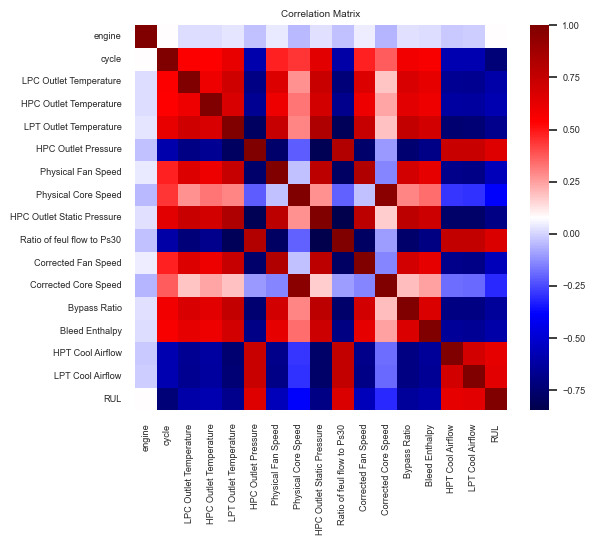

In [7]:
#df_train.describe().T
zero_std_cols = [ 'setting_1', 'setting_2' , 'setting_3','Required Fan Speed', 'Fan Inlet Temperature', 'Required Fan Conversion Speed', 'Burner feul-air ratio', 'Fan Inlet Pressure', 'Engine Pressure Ratio (P50/P2)', 'Bypass-duct Pressure']
df_train.drop(zero_std_cols, axis = 1, inplace = True)
df_test.drop(zero_std_cols, axis = 1, inplace = True)
# Calculate the correlation matrix
corr_matrix = df_train.corr()

# Plot the correlation matrix as a heatmap
plt.figure(figsize=(6, 5))
sns.set(font_scale=.6)
sns.heatmap(corr_matrix, annot=False, cmap='seismic', linewidths=0)
plt.title('Correlation Matrix')
plt.show()

In [8]:
# Drop columns with correlation above 0.90
high_corr_cols = set()
for i in range(len(corr_matrix.columns)):
    for j in range(i):
        if abs(corr_matrix.iloc[i, j]) > 0.90:
            colname = corr_matrix.columns[i]
            high_corr_cols.add(colname)

df_train.drop(high_corr_cols, axis=1, inplace=True)
df_test.drop(high_corr_cols, axis=1, inplace=True)


print(f"{len(high_corr_cols)} column(s) have been dropped because of high correlation: .90. Column Names are: {high_corr_cols}")

1 column(s) have been dropped because of high correlation: .90. Column Names are: {'Corrected Core Speed'}


### ON To Exploratory Data Analysis

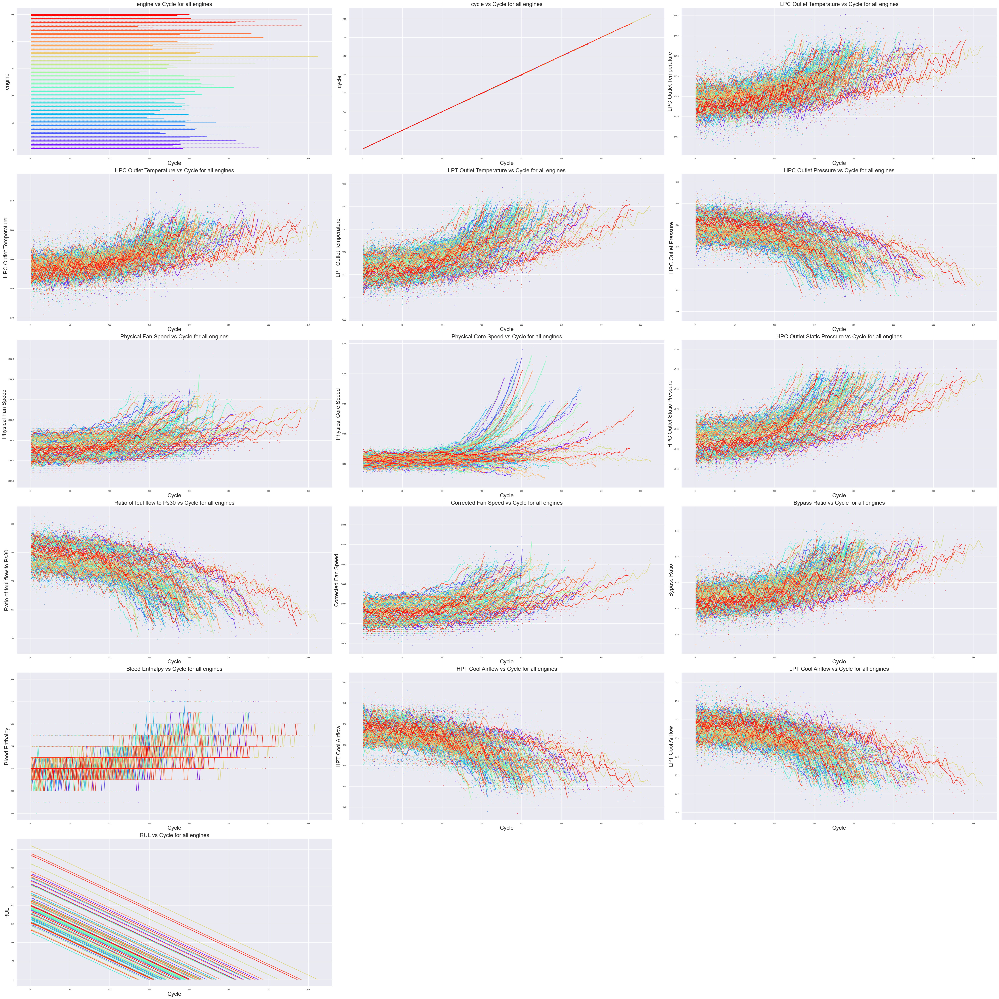

In [9]:
import scipy.ndimage

# Let's assume you have 9 features, adjust the number accordingly
n_rows = 6
n_cols = 3
fig, axs = plt.subplots(n_rows, n_cols, figsize=(50, 50))
sigma = 2 # smoothing value
features = df_train.columns.tolist()
engines = list(df_train['engine'].unique())
# Using colormap to provide  colors
colors = cm.rainbow(np.linspace(0, 1, len(engines)))

# Assigning colors to each engine
engine_colors = {engine:color for engine, color in zip(engines, colors)} 


for i, feature in enumerate(features):
    row = i // n_cols
    col = i % n_cols
    for engine in engines:
        X_1 = df_train[df_train['engine'] == engine]
        X = X_1['cycle']
        Y = X_1[feature]
        axs[row, col].scatter(X, Y, s=.5, color=engine_colors[engine], label=f'Engine {engine} points')

        # Gaussian smoothing
        Y_smooth = scipy.ndimage.gaussian_filter1d(Y, sigma)
        axs[row, col].plot(X, Y_smooth, color=engine_colors[engine], label=f'Engine {engine} Gaussian Smooth')

    axs[row, col].set_title((f"{feature} vs Cycle for all engines"), fontsize= 20)
    axs[row, col].set_xlabel(('Cycle'), fontsize= 20)
    axs[row, col].set_ylabel((feature), fontsize= 20)

# Remove empty subplots if any
if len(features) < n_rows*n_cols:
    for i in range(len(features), n_rows*n_cols):
        fig.delaxes(axs.flatten()[i])

plt.tight_layout()
plt.show()


## choosing model cuz i can't choose my clothes

### creating test-train datasets

In [10]:
df_train['RUL'] = df_train['RUL'].apply(lambda x: min(x, 125))
#df_test['RUL'] = df_test['RUL'].apply(lambda x: min(x, 125))


In [11]:
X_train, X_val, y_train, y_val = train_test_split(df_train.drop(columns = [ 'engine' , 'RUL']), df_train['RUL'], test_size = 0.3, random_state=22)

#Scale the data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled = scaler.transform(X_val)

# Convert the data to TensorFlow tensors
X_train_scaled = tf.convert_to_tensor(X_train_scaled, dtype=tf.float32)
X_test_scaled = tf.convert_to_tensor(X_val_scaled, dtype=tf.float32)


In [12]:
# applying the min-max scaler to the train-test data
X_train_minmax = scaler.fit_transform(X_train)
X_val_minmax = scaler.transform(X_val)

# Convert the data to TensorFlow tensors
X_train_minmax = tf.convert_to_tensor(X_train_minmax, dtype=tf.float32)
X_val_minmax = tf.convert_to_tensor(X_val_minmax, dtype=tf.float32)

In [13]:
### remove the commas to use the smoothed function
"""sigma = 0.01

from scipy.ndimage import gaussian_filter

# Apply the Gaussian filter to all columns
df_train_smoothed = df_train.drop(columns = ['engine', 'RUL']).copy()
for col in df_smoothed.columns:
    df_smoothed[col] = gaussian_filter(df_smoothed[col], sigma)

X_train_smoothed, X_test_smoothed, y_train, y_test = train_test_split((df_train_smoothed), df_train['RUL'], test_size = 0.3, shuffle= True)

#Scale the data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Convert the data to TensorFlow tensors
X_train_scaled = tf.convert_to_tensor(X_train_smoothed, dtype=tf.float32)
X_test_scaled = tf.convert_to_tensor(X_test_smoothed, dtype=tf.float32)
"""


"sigma = 0.01\n\nfrom scipy.ndimage import gaussian_filter\n\n# Apply the Gaussian filter to all columns\ndf_train_smoothed = df_train.drop(columns = ['engine', 'RUL']).copy()\nfor col in df_smoothed.columns:\n    df_smoothed[col] = gaussian_filter(df_smoothed[col], sigma)\n\nX_train_smoothed, X_test_smoothed, y_train, y_test = train_test_split((df_train_smoothed), df_train['RUL'], test_size = 0.3, shuffle= True)\n\n#Scale the data\nscaler = StandardScaler()\nX_train_scaled = scaler.fit_transform(X_train)\nX_test_scaled = scaler.transform(X_test)\n\n# Convert the data to TensorFlow tensors\nX_train_scaled = tf.convert_to_tensor(X_train_smoothed, dtype=tf.float32)\nX_test_scaled = tf.convert_to_tensor(X_test_smoothed, dtype=tf.float32)\n"

### Trying out ANN

In [14]:
lamda = 5
tf.random.set_seed(22)

# Define the model architecture
seq_model = tf.keras.Sequential([
    tf.keras.layers.Dense(500, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(lamda), input_dim=X_train.shape[1]),
    tf.keras.layers.Dense(100, activation='tanh', kernel_regularizer=tf.keras.regularizers.l2(lamda)),   
    tf.keras.layers.Dense(1, activation='relu')
])
# compile the model
seq_model.compile(
    optimizer=Adam(learning_rate=0.001),
    loss=MeanSquaredError(),
    metrics=[MeanAbsoluteError()]
)

# Train the model
seq_model.fit(X_train_scaled, y_train, epochs=10, batch_size=32, validation_data=(X_val_scaled, y_val), verbose = 2)

Epoch 1/10
452/452 - 1s - loss: 4933.4517 - mean_absolute_error: 58.2463 - val_loss: 2568.4790 - val_mean_absolute_error: 41.4445
Epoch 2/10
452/452 - 0s - loss: 1636.5571 - mean_absolute_error: 32.8719 - val_loss: 1005.4512 - val_mean_absolute_error: 26.3152
Epoch 3/10
452/452 - 0s - loss: 741.3252 - mean_absolute_error: 22.3469 - val_loss: 562.5002 - val_mean_absolute_error: 19.2714
Epoch 4/10
452/452 - 0s - loss: 490.1340 - mean_absolute_error: 17.4985 - val_loss: 442.4663 - val_mean_absolute_error: 16.0960
Epoch 5/10
452/452 - 0s - loss: 409.0800 - mean_absolute_error: 15.0833 - val_loss: 402.7266 - val_mean_absolute_error: 14.8533
Epoch 6/10
452/452 - 1s - loss: 376.2363 - mean_absolute_error: 13.7078 - val_loss: 398.5401 - val_mean_absolute_error: 12.6589
Epoch 7/10
452/452 - 1s - loss: 362.2640 - mean_absolute_error: 12.9739 - val_loss: 350.0671 - val_mean_absolute_error: 12.1904
Epoch 8/10
452/452 - 1s - loss: 352.7989 - mean_absolute_error: 12.5623 - val_loss: 345.0442 - val_m

The absolute error with test set is 11.979719040312943



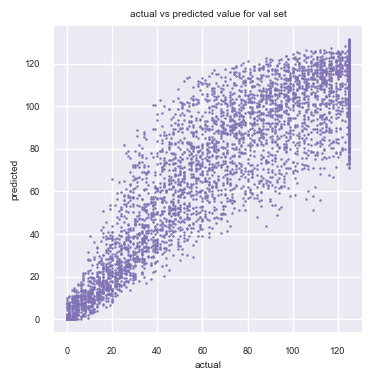

In [15]:
# Make predictions on the test set
y_pred_test = seq_model.predict(X_val_scaled, verbose=0)
mse = mean_absolute_error(y_val , y_pred_test)
print(f"The absolute error with test set is {(mse)}\n")
vs = pd.DataFrame({'actual': y_val.tolist(), 'pred': y_pred_test.tolist()})
vs.head()
plt.figure(figsize=(4,4))
plt.scatter(vs['actual'].tolist(), vs['pred'].tolist(), color = 'm', s=.6)
plt.title('actual vs predicted value for val set')
plt.xlabel('actual')
plt.ylabel('predicted')
plt.show()

In [16]:
# Preparing the test set
X_test = df_test.drop(columns = ['engine', 'RUL'])
y_test = df_test['RUL']

# Applying scaling normzalization to the test set and convert to tensor object
X_test_scaled = scaler.transform(X_test)
X_test_scaled = tf.convert_to_tensor(X_test_scaled, dtype=tf.float32)


The absolute error with test set is 10.865702556959361



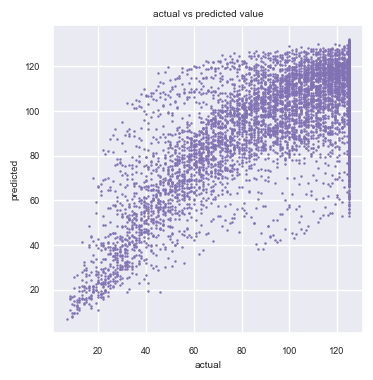

In [17]:
# Make predictions on the test set
y_pred_test = seq_model.predict(X_test_scaled, verbose=0)
mse = mean_absolute_error(y_test , y_pred_test)
print(f"The absolute error with test set is {(mse)}\n")
vs = pd.DataFrame({'actual': y_test.tolist(), 'pred': y_pred_test.tolist()})
vs.head()
plt.figure(figsize=(4,4))
plt.scatter(vs['actual'].tolist(), vs['pred'].tolist(), color = 'm', s=.6)
plt.title('actual vs predicted value')
plt.xlabel('actual')
plt.ylabel('predicted')
plt.show()

### now it's LSTM's turn

In [18]:
def create_3d_data(data, labels, window_size):
    if isinstance(data, pd.DataFrame):
        data = data.values
    if isinstance(labels, pd.Series) or isinstance(labels, pd.DataFrame):
        labels = labels.values
    X = []
    y = []
    for i in range(len(data) - window_size):
        X.append(data[i:i + window_size])
        y.append(labels[i + window_size])
    return np.array(X), np.array(y)


In [19]:
# Scaling the data, first selcting the columns to scale
columns_to_scale = df_train.columns.difference(["engine", "RUL", 'cycle'])

# Applyinh the scaling to training data
scaler = StandardScaler()
df_train_scaled = pd.DataFrame(scaler.fit_transform(df_train[columns_to_scale]), columns=columns_to_scale)

# Combine the scaled columns with the original "engine", "cycle" and "RUL" columns
df_train_scaled = pd.concat([df_train[['engine',  "cycle"]] , df_train_scaled , df_train[["RUL",]]], axis=1)

# Applying the scaling to test data
df_test_scaled = pd.DataFrame(scaler.transform(df_test[columns_to_scale]), columns=columns_to_scale)

# Combine the scaled columns with the original "engine", "cycle" and "RUL" columns
df_test_scaled = pd.concat([df_test[['engine',  "cycle"]] , df_test_scaled , df_test[["RUL",]]], axis=1)

In [20]:

data_engine_3d_list = []
labels_engine_3d_list = []
window_size = 5

for engine in engines:
    data_engine = df_train_scaled[df_train_scaled['engine'] == engine].copy()
    data_engine.drop(columns=['engine', 'RUL'], inplace=True)

    labels_engine = df_train_scaled[df_train_scaled['engine'] == engine].copy()
    labels_engine = labels_engine['RUL']
    
    data_engine_3d, labels_engine_3d = create_3d_data(data_engine, labels_engine, window_size)
    
    data_engine_3d_list.append(data_engine_3d)
    labels_engine_3d_list.append(labels_engine_3d)

train_data = np.concatenate(data_engine_3d_list, axis=0)
train_labels = np.concatenate(labels_engine_3d_list, axis=0)
train_labels = train_labels.squeeze()


In [21]:

data_engine_3d_list = []
labels_engine_3d_list = []

for engine in engines:
    data_engine = df_test_scaled[df_test_scaled['engine'] == engine].copy()
    data_engine.drop(columns=['engine', 'RUL'], inplace=True)

    labels_engine = df_test_scaled[df_test_scaled['engine'] == engine].copy()
    labels_engine = labels_engine['RUL']
    
    data_engine_3d, labels_engine_3d = create_3d_data(data_engine, labels_engine, window_size)
    
    data_engine_3d_list.append(data_engine_3d)
    labels_engine_3d_list.append(labels_engine_3d)

test_data = np.concatenate(data_engine_3d_list, axis=0)
test_labels = np.concatenate(labels_engine_3d_list, axis=0)
test_labels = test_labels.squeeze()


In [22]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import SimpleRNN, LSTM, Dense, Dropout, BatchNormalization
from tensorflow.keras.callbacks import ReduceLROnPlateau,EarlyStopping
from tensorflow.keras import regularizers
from tensorflow.keras import initializers

tf.random.set_seed(22)
# The shape of input is going to be (Number of Time Steps, Number of Features per time step)
input_shape = (train_data.shape[1], train_data.shape[2])

rnn_model = Sequential()
rnn_model.add(LSTM(200, activation='relu', return_sequences=True, input_shape=input_shape, kernel_regularizer = regularizers.l2(.005)))
rnn_model.add(BatchNormalization())
rnn_model.add(Dropout(.1))
rnn_model.add(Dense(100, activation='relu', kernel_regularizer = regularizers.l2(.005)))
rnn_model.add(Dropout(.1))
rnn_model.add(Dense(50, activation='relu', kernel_regularizer = regularizers.l2(.005)))
rnn_model.add(Dense(1, activation= 'relu'))

# Set random variable initialization
initializer = initializers.GlorotUniform(seed=2)
for layer in rnn_model.layers:
    for variable in layer.trainable_variables:
        variable.assign(initializer(variable.shape))

rnn_model.compile(
    optimizer=Adam(learning_rate=0.001, clipvalue=1),
    loss=tf.keras.losses.MeanSquaredError(),
    metrics=[MeanAbsoluteError()]
)

history = rnn_model.fit(train_data, train_labels, epochs=10, verbose=2, batch_size=64, validation_data=(test_data, test_labels))
rnn_model.reset_states()

Epoch 1/10
315/315 - 8s - loss: 1733.1298 - mean_absolute_error: 27.4153 - val_loss: 506.6769 - val_mean_absolute_error: 19.0903
Epoch 2/10
315/315 - 4s - loss: 339.9325 - mean_absolute_error: 13.8868 - val_loss: 551.7334 - val_mean_absolute_error: 15.7843
Epoch 3/10
315/315 - 4s - loss: 335.3148 - mean_absolute_error: 13.7906 - val_loss: 320.9981 - val_mean_absolute_error: 13.9519
Epoch 4/10
315/315 - 4s - loss: 330.0370 - mean_absolute_error: 13.6648 - val_loss: 346.7960 - val_mean_absolute_error: 12.4138
Epoch 5/10
315/315 - 4s - loss: 323.2222 - mean_absolute_error: 13.4782 - val_loss: 267.6797 - val_mean_absolute_error: 11.1200
Epoch 6/10
315/315 - 4s - loss: 317.6129 - mean_absolute_error: 13.3280 - val_loss: 257.4394 - val_mean_absolute_error: 10.6896
Epoch 7/10
315/315 - 4s - loss: 318.4101 - mean_absolute_error: 13.3520 - val_loss: 320.8378 - val_mean_absolute_error: 13.4888
Epoch 8/10
315/315 - 3s - loss: 314.9850 - mean_absolute_error: 13.2443 - val_loss: 296.7353 - val_mean

In [23]:
# Access error
final_error = history.history['mean_absolute_error'][-1]
# Access layers details
layer_count = len(rnn_model.layers)
layer_types = [layer.__class__.__name__ for layer in rnn_model.layers]
layer_units = [layer.units for layer in rnn_model.layers if hasattr(layer, 'units')]
# Get the config of LSTM layer
lstm_layer_config = rnn_model.layers[0].get_config()
# Extract regularization parameter (l2) from config
l2_reg_parameter = lstm_layer_config['kernel_regularizer']['config']['l2']


In [24]:
# Make predictions on the test set
#rnn_model.fit(data, labels, epochs=20, verbose=2, batch_size=32)
#y_pred_sqrt = rnn_model.predict(test_data, verbose=2)
y_pred = rnn_model.predict(test_data, verbose=2)

394/394 - 1s


In [25]:
# Extract the last value of the last time step of each sequence
y_pred = [y_pred[i][2][-1] for i in range(len(y_pred))]

The absolute error with test set is 9.88510508649347



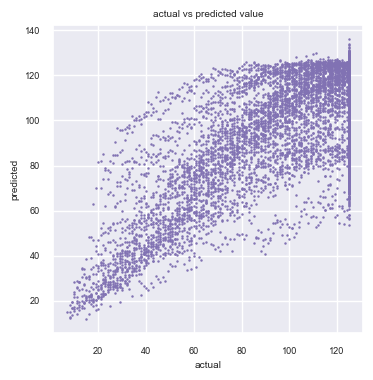

In [26]:
# Make predictions on the test set
mse = mean_absolute_error(y_pred , test_labels)
print(f"The absolute error with test set is {(mse)}\n")
vs = pd.DataFrame({'actual': test_labels.tolist(), 'pred': y_pred})

plt.figure(figsize=(4,4))
plt.scatter(vs['actual'].tolist(), vs['pred'].tolist(), color = 'm', s=.6)
plt.title('actual vs predicted value')
plt.xlabel('actual')
plt.ylabel('predicted')
plt.show()

In [27]:
# Creating an evaluation matrix
Evaluation_Matrix = pd.DataFrame({'Training Accuracy': [], 'Testing Accuracy' : [], 'Window Size' : [], 'Layers' : [], 'Learning Rate' : [], 'Regularization' : [], 'Changes' : []})

In [28]:
training_accuracy = final_error
testing_accuracy = mse
learning_rate = rnn_model.optimizer.learning_rate.numpy()
regularizer = l2_reg_parameter
window_size = window_size
changes = ''

new_test = {'Training Accuracy': training_accuracy, 'Testing Accuracy' : testing_accuracy, 'Window Size' : window_size, 'Layers' : layer_types + layer_units, 'Learning Rate' : learning_rate, 'Regularization' : regularizer, 'Changes' : changes}

Evaluation_Matrix = Evaluation_Matrix.append(new_test, ignore_index=True)
Evaluation_Matrix

C:\Users\aseem\AppData\Local\Temp\ipykernel_26444\2823010932.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Evaluation_Matrix = Evaluation_Matrix.append(new_test, ignore_index=True)


,Training Accuracy,Testing Accuracy,Window Size,Layers,Learning Rate,Regularization,Changes
0,13.09466,9.885105,5.0,"[LSTM, BatchNormalization, Dropout, Dense, Dro...",0.001,0.005,
